In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import time
import sklearn
import numpy as np
import pandas as pd
from tqdm import tqdm
from random import random
from tabulate import tabulate
from collections import Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.tree import ExtraTreeClassifier

evaluate={'Acc':"Accuracy", 'b_Acc':"Balanced Accuracy", 'F1':"F1 Score", 'kap':"Kappa", 'ROC':"Roc"}

In [3]:
def folder(f_name): #this function creates a folder named "attacks" in the program directory.
    try:
        if not os.path.exists(f_name):
            os.makedirs(f_name)
    except OSError:
        print ("The folder could not be created!")

In [4]:
def find_the_way(path,file_format,con=""):
    files_add = []
    # r=root, d=directories, f = files
    for r, d, f in os.walk(path):
        for file in f:
            if file_format in file:
                if con in file:
                    files_add.append(os.path.join(r, file))  
            
    return files_add

files_add=find_the_way("./INPUT/SM",".csv")
files_add

['./INPUT/SM\\DoS-SYN-1.csv',
 './INPUT/SM\\DoS-SYN-2.csv',
 './INPUT/SM\\DoS-SYN-3.csv',
 './INPUT/SM\\DoS-SYN-4.csv',
 './INPUT/SM\\DoS-SYN-5.csv',
 './INPUT/SM\\DoS-SYN-6.csv',
 './INPUT/SM\\MB-ACK-1.csv',
 './INPUT/SM\\MB-ACK-2.csv',
 './INPUT/SM\\MB-ACK-3.csv',
 './INPUT/SM\\MB-ACK-4.csv',
 './INPUT/SM\\MB-BF-1.csv',
 './INPUT/SM\\MB-BF-2.csv',
 './INPUT/SM\\MB-BF-3.csv',
 './INPUT/SM\\MB-BF-4.csv',
 './INPUT/SM\\MB-BF-5.csv',
 './INPUT/SM\\MB-HDis-1.csv',
 './INPUT/SM\\MB-HDis-2.csv',
 './INPUT/SM\\MB-HDis-3.csv',
 './INPUT/SM\\MB-HDis-4.csv',
 './INPUT/SM\\MB-HDis-5.csv',
 './INPUT/SM\\MB-HTTP-1.csv',
 './INPUT/SM\\MB-HTTP-2.csv',
 './INPUT/SM\\MB-HTTP-3.csv',
 './INPUT/SM\\MB-HTTP-4.csv',
 './INPUT/SM\\MB-UDP-1.csv',
 './INPUT/SM\\MB-UDP-2.csv',
 './INPUT/SM\\MB-UDP-3.csv',
 './INPUT/SM\\MB-UDP-4.csv',
 './INPUT/SM\\MitM-ARP-1.csv',
 './INPUT/SM\\MitM-ARP-2.csv',
 './INPUT/SM\\MitM-ARP-3.csv',
 './INPUT/SM\\MitM-ARP-4.csv',
 './INPUT/SM\\MitM-ARP-5.csv',
 './INPUT/SM\\MitM-ARP-

In [5]:
ml_list={"ET": ExtraTreeClassifier()}#,"SVC":SVC()}}

In [6]:
def target_name(name):
    df = pd.read_csv(name,usecols=["Label"])
    target_names=sorted(list(df["Label"].unique()))
    return target_names

In [7]:
folder("results/compare/SS/")
folder("results/compare/CV/")
folder("results/compare/DD/")
folder("pdfs")

## Calculation of evaluations

In [8]:
def score(train_time,test_time,predict,y_test,class_based_results,repeat,cv,dname,ml,sw):
    train_time=train_time[0]
    test_time=test_time[0]
    rc=sklearn.metrics.recall_score(y_test, predict,average= "macro")
    pr=sklearn.metrics.precision_score(y_test, predict,average= "macro")
    f_1=sklearn.metrics.f1_score(y_test, predict,average= "macro")     
    accuracy=sklearn.metrics.accuracy_score(y_test, predict)
    accuracy_b=sklearn.metrics.balanced_accuracy_score( y_test,predict)
    kappa=sklearn.metrics.cohen_kappa_score(y_test, predict,labels=None, weights=None, sample_weight=None)
    try:
        roc=sklearn.metrics.roc_auc_score(y_test, predict)
    except:roc=0
    report = sklearn.metrics.classification_report(y_test, predict, target_names=target_names,output_dict=True)
    cr = pd.DataFrame(report).transpose()
    line=[dname,sw,repeat,cv,ml,accuracy,accuracy_b,pr,rc,f_1,kappa,roc,train_time,test_time]

    if class_based_results.empty:
        class_based_results =cr
    else:
        class_based_results = class_based_results.add(cr, fill_value=0)
    return class_based_results,line

In [9]:
def ML(loop1,loop2,output_csv,cols,dname,sw):
    fold=5
    repetition=25
    for ii in ml_list:
        class_based_results=pd.DataFrame()#"" #pd.DataFrame(0, index=np.arange((len(target_names)+3)), columns=["f1-score","precision","recall","support"])
        cm=pd.DataFrame()
        cv=0
        lines=[["Attack","Feature","T","CV","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
        for i in range(repetition):

                df = pd.read_csv(loop1,usecols=cols)#,header=None )
                df=df.fillna(0)
                X_train =df[df.columns[0:-1]]
                X_train=np.array(X_train)
                df[df.columns[-1]] = df[df.columns[-1]].astype('category')
                y_train=df[df.columns[-1]].cat.codes  


                df = pd.read_csv(loop2,usecols=cols)#,header=None )
                df=df.fillna(0)
                X_test =df[df.columns[0:-1]]
                X_test=np.array(X_test)
                df[df.columns[-1]] = df[df.columns[-1]].astype('category')
                y_test=df[df.columns[-1]].cat.codes  


                #dname=loop1  [6:-13]  
                results_y=[]
       
                results_y.append(y_test)


                precision=[]
                recall=[]
                f1=[]
                accuracy=[]
                train_time=[]
                test_time=[]
                total_time=[]
                kappa=[]
                accuracy_b=[]

                    #machine learning algorithm is applied in this section
                clf = ml_list[ii]#choose algorithm from ml_list dictionary
                second=time.time()
                clf.fit(X_train, y_train)
                train_time.append(float((time.time()-second)) )
                second=time.time()
                predict =clf.predict(X_test)
                test_time.append(float((time.time()-second)) )
    
                altime=0
                class_based_results,line=score(train_time,test_time,predict,y_test,class_based_results,cv,i,dname,ii,sw)
                lines.append(line)

        results = pd.DataFrame (lines[1:], columns = lines[0])
        results.to_csv(output_csv.replace("ML",ii),index=False)
       
        results=results.mean()
        results=results.round(3)
        #print (tabulate(results, headers=list(results.columns)))
        #print()
        return list(results.values)






In [10]:
def ML_CV(loop1,loop2,output_csv,cols,dname,sw):
    fold=5
    repetition=5
    for ii in ml_list:
        class_based_results=pd.DataFrame()#"" #pd.DataFrame(0, index=np.arange((len(target_names)+3)), columns=["f1-score","precision","recall","support"])
        cm=pd.DataFrame()
        cv=0
        lines=[["Attack","Feature","T","CV","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
        for i in range(repetition):

            rnd = random()
            
            kfold = sklearn.model_selection.KFold(n_splits=fold, shuffle=True, random_state=int(rnd*100))  
            cv=0
            df = pd.read_csv(loop1,usecols=cols)#,header=None )
            ##df = df.reset_index(drop=True)
            df=df.fillna(0)

            #del df["MAC"] # if dataset has MAC colomn please uncomment this line
            X =df[df.columns[0:-1]]
            X=np.array(X)
            df[df.columns[-1]] = df[df.columns[-1]].astype('category')
            y=df[df.columns[-1]].cat.codes  
            X.shape
            for train_index, test_index in kfold.split(X):
                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y[train_index], y[test_index]  

                #dname=loop1  [6:-13]  
                results_y=[]
                cv+=1
                results_y.append(y_test)


                precision=[]
                recall=[]
                f1=[]
                accuracy=[]
                train_time=[]
                test_time=[]
                total_time=[]
                kappa=[]
                accuracy_b=[]

                    #machine learning algorithm is applied in this section
                clf = ml_list[ii]#choose algorithm from ml_list dictionary
                second=time.time()
                clf.fit(X_train, y_train)
                train_time.append(float((time.time()-second)) )
                second=time.time()
                predict =clf.predict(X_test)
                test_time.append(float((time.time()-second)) )
    
                altime=0
                class_based_results,line=score(train_time,test_time,predict,y_test,class_based_results,cv,i,dname,ii,sw)
                lines.append(line)

        results = pd.DataFrame (lines[1:], columns = lines[0])
        results.to_csv(output_csv.replace("ML",ii),index=False)

        results=results.mean()
        results=results.round(3)
        #print (tabulate(results, headers=list(results.columns)))
        #print()
        return list(results.values)





In [11]:
features=['random', 'ts',#, #'Ether_dst', 'Ether_src', 'IP_src', 'IP_dst', 
        'pck_size', 'Ether_type', 'LLC_dsap', 'LLC_ssap', 'LLC_ctrl', 'EAPOL_version', 'EAPOL_type', 'EAPOL_len', 'IP_version', 'IP_ihl', 'IP_tos', 'IP_len', 'IP_flags', 'IP_Z', 'IP_MF', 'IP_id', 'IP_chksum', 'IP_DF', 'IP_frag', 'IP_ttl', 'IP_proto', 'IP_options', 'ICMP_type', 'ICMP_code', 'ICMP_chksum', 'ICMP_id', 'ICMP_seq', 'ICMP_ts_ori', 'ICMP_ts_rx', 'ICMP_ts_tx', 'ICMP_ptr', 'ICMP_reserved', 'ICMP_length', 'ICMP_nexthopmtu', #'ICMP_unused',
         'TCP_seq', 'TCP_ack', 'TCP_dataofs', 'TCP_reserved', 'TCP_flags', 'TCP_FIN', 'TCP_SYN', 'TCP_RST', 
 'TCP_PSH', 'TCP_ACK', 'TCP_URG', 'TCP_ECE', 'TCP_CWR', 'TCP_window', 'TCP_chksum', 'TCP_urgptr', 'TCP_options', 'UDP_len', 'UDP_chksum', 'DHCP_options', 'BOOTP_op', 'BOOTP_htype', 'BOOTP_hlen', 'BOOTP_hops', 'BOOTP_xid', 'BOOTP_secs', 'BOOTP_flags', 'BOOTP_sname', 'BOOTP_file', 'BOOTP_options', 'DNS_length', 'DNS_id', 'DNS_qr', 'DNS_opcode', 'DNS_aa', 'DNS_tc', 'DNS_rd', 'DNS_ra', 'DNS_z', 'DNS_ad', 'DNS_cd', 'DNS_rcode', 'DNS_qdcount', 'DNS_ancount', 'DNS_nscount', 'DNS_arcount', 'sport_class', 'dport_class', 'sport23', 'dport23', 'sport_bare', 'dport_bare', 'payload_bytes', 'entropy', 'Protocol',
 'dst_IP_diversity', 'dst_port_diversity', 'src_IP_diversity', 'IP_add_count', 'sport', 'dport', #'ID',
         'pck_size_diff', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'ts_diff', 'ts_mean_WE', 'ts_std_WE', 'ts_sum_of_EW', 'TCP_window_diff', 'TCP_window_mean_WE', 'TCP_window_std_WE', 'TCP_window_sum_of_EW', 'payload_bytes_diff', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'entropy_diff', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'pck_size_mean_2', 'pck_size_std_2', 'ts_mean_2', 'ts_std_2', 'TCP_window_mean_2', 'TCP_window_std_2', 'payload_bytes_mean_2',
 'payload_bytes_std_2', 'entropy_mean_2', 'entropy_std_2', 'dport_sum', 'sport_sum', 'TCP_FIN_sum', 'TCP_SYN_sum', 'TCP_RST_sum', 'TCP_PSH_sum', 'TCP_ACK_sum', 'TCP_URG_sum', 'TCP_ECE_sum', 'TCP_CWR_sum', 'TCP_FIN_ratio', 'TCP_SYN_ratio', 'TCP_RST_ratio', 'TCP_PSH_ratio', 'TCP_ACK_ratio', 'TCP_URG_ratio', 'TCP_ECE_ratio', 'TCP_CWR_ratio', 'sum', 'TCP_FIN_SR', 'TCP_SYN_SR', 'TCP_RST_SR', 'TCP_PSH_SR', 'TCP_ACK_SR', 'TCP_URG_SR', 'TCP_ECE_SR', 'TCP_CWR_SR', 'pck_size_mean_6', 'pck_size_std_6', 'ts_mean_6', 'ts_std_6', 'TCP_window_mean_6', 'TCP_window_std_6', 'payload_bytes_mean_6', 'payload_bytes_std_6',
 'entropy_mean_6', 'entropy_std_6', 'pck_size_mean_9', 'pck_size_std_9', 'ts_mean_9', 'ts_std_9', 'TCP_window_mean_9', 'TCP_window_std_9', 'payload_bytes_mean_9', 'payload_bytes_std_9', 'entropy_mean_9', 'entropy_std_9']


In [12]:
len(features)

174

In [13]:
file_list={'./INPUT/SM/DoS-SYN-1.csv':"SYN",
'./INPUT/SM/MB-HTTP-4.csv':"HTTP",
'./INPUT/SM/MB-ACK-4.csv':"ACK",
'./INPUT/SM/MB-UDP-4.csv':"UDP",
'./INPUT/SM/MitM-ARP-6.csv':"ARP",
'./INPUT/SM/Scan-Port-3.csv':"SP",
'./INPUT/SM/MB-BF-5.csv':"BF",
'./INPUT/SM/Scan-OS-3.csv':"OS",  
'./INPUT/SM/Scan-HDis-3.csv':"SCHD",
'./INPUT/SM/MB-HDis-3.csv':"MHDis"}

# CV

In [14]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            output_csv=f"./results/compare/CV/ET_{file_list[train]}_{dname}.csv"
            #print(f"{list[train]} Dataset - Feature {number+1}/{len(features)}")
            temp=ML_CV(train,"",output_csv,feature,dname,file_list[train])
            temp=temp[2:]
            temp=[file_list[train],dname,"ET"]+temp
            lines.append(temp)
            
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))


100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:46<00:00,  1.63it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SYN       random                   ET    0.505    0.501   0.501  0.501  0.501   0.003  0.501    0.008     0.001
  1  SYN       ts                       ET    0.561    0.553   0.72   0.553  0.445   0.102  0.553    0.001     0.001
  2  SYN       pck_size                 ET    0.999    0.999   0.999  0.999  0.999   0.998  0.999    0.002     0
  3  SYN       Ether_type               ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.001     0
  4  SYN       LLC_dsap                 ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0         0
  5  SYN       LLC_ssap                 ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0         0
  6  SYN       LLC_ctrl                 ET    0.542    0.5     0.271  0.5    0.3

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [02:05<00:00,  1.39it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
  0  HTTP      random                   ET    0.924    0.502   0.502  0.502  0.502  0.003  0.502    0.004     0.001
  1  HTTP      ts                       ET    0.969    0.796   0.795  0.796  0.795  0.59   0.796    0.002     0.001
  2  HTTP      pck_size                 ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0         0
  3  HTTP      Ether_type               ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.001     0
  4  HTTP      LLC_dsap                 ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.002     0.001
  5  HTTP      LLC_ssap                 ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.002     0
  6  HTTP      LLC_ctrl                 ET    0.96     0.5     0.48   0.5    0.49   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [02:04<00:00,  1.40it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  ACK       random                   ET    0.87     0.5     0.5    0.5    0.5    -0      0.5      0.007     0
  1  ACK       ts                       ET    0.898    0.581   0.591  0.581  0.585   0.171  0.581    0.002     0.001
  2  ACK       pck_size                 ET    0.959    0.978   0.816  0.978  0.876   0.753  0.978    0.001     0
  3  ACK       Ether_type               ET    0.93     0.5     0.465  0.5    0.482   0      0.5      0.001     0
  4  ACK       LLC_dsap                 ET    0.93     0.5     0.465  0.5    0.482   0      0.5      0.001     0
  5  ACK       LLC_ssap                 ET    0.93     0.5     0.465  0.5    0.482   0      0.5      0         0
  6  ACK       LLC_ctrl                 ET    0.93     0.5     0.465  0.5    0.482  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [02:14<00:00,  1.29it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  UDP       random                   ET    0.521    0.498   0.498  0.498  0.498  -0.004  0.498    0.009     0.001
  1  UDP       ts                       ET    0.833    0.829   0.824  0.829  0.826   0.653  0.829    0.005     0.001
  2  UDP       pck_size                 ET    1        1       1      1      1       0.999  1        0.001     0
  3  UDP       Ether_type               ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.001     0.001
  4  UDP       LLC_dsap                 ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.001     0
  5  UDP       LLC_ssap                 ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0         0
  6  UDP       LLC_ctrl                 ET    0.608    0.5     0.304  0.5   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [02:17<00:00,  1.26it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
  0  ARP       random                   ET    0.627    0.502   0.502  0.502  0.502  0.005  0.502    0.009     0.001
  1  ARP       ts                       ET    0.951    0.934   0.934  0.934  0.934  0.868  0.934    0.002     0.001
  2  ARP       pck_size                 ET    0.779    0.563   0.83   0.563  0.549  0.175  0.563    0.002     0
  3  ARP       Ether_type               ET    0.751    0.502   0.876  0.502  0.434  0.007  0.502    0.001     0
  4  ARP       LLC_dsap                 ET    0.75     0.5     0.375  0.5    0.429  0      0.5      0         0
  5  ARP       LLC_ssap                 ET    0.75     0.5     0.375  0.5    0.429  0      0.5      0.001     0
  6  ARP       LLC_ctrl                 ET    0.75     0.5     0.375  0.5    0.429  0   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:22<00:00,  2.11it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SP        random                   ET    0.805    0.502   0.502  0.502  0.502   0.004  0.502    0.002     0.001
  1  SP        ts                       ET    0.974    0.931   0.936  0.931  0.933   0.866  0.931    0.002     0
  2  SP        pck_size                 ET    0.999    0.997   0.997  0.997  0.997   0.994  0.997    0.001     0
  3  SP        Ether_type               ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.001     0
  4  SP        LLC_dsap                 ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.001     0
  5  SP        LLC_ssap                 ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.001     0
  6  SP        LLC_ctrl                 ET    0.89     0.5     0.445  0.5    0.471  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:21<00:00,  2.14it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  BF        random                   ET    0.909    0.505   0.505  0.505  0.505   0.011  0.505    0.003     0
  1  BF        ts                       ET    0.967    0.834   0.817  0.834  0.825   0.65   0.834    0.001     0
  2  BF        pck_size                 ET    0.961    0.626   0.889  0.626  0.683   0.372  0.626    0.001     0
  3  BF        Ether_type               ET    0.951    0.5     0.476  0.5    0.488   0      0.5      0.001     0.001
  4  BF        LLC_dsap                 ET    0.951    0.5     0.476  0.5    0.488   0      0.5      0         0
  5  BF        LLC_ssap                 ET    0.951    0.5     0.476  0.5    0.488   0      0.5      0.001     0
  6  BF        LLC_ctrl                 ET    0.951    0.5     0.476  0.5    0.488  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:21<00:00,  2.14it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  OS        random                   ET    0.893    0.502   0.502  0.502  0.502   0.004  0.502    0.003     0
  1  OS        ts                       ET    0.981    0.925   0.902  0.925  0.912   0.825  0.925    0         0
  2  OS        pck_size                 ET    0.963    0.724   0.899  0.724  0.783   0.567  0.724    0         0
  3  OS        Ether_type               ET    0.943    0.5     0.471  0.5    0.485   0      0.5      0         0
  4  OS        LLC_dsap                 ET    0.943    0.5     0.471  0.5    0.485   0      0.5      0         0
  5  OS        LLC_ssap                 ET    0.943    0.5     0.471  0.5    0.485   0      0.5      0         0
  6  OS        LLC_ctrl                 ET    0.943    0.5     0.471  0.5    0.485   0  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:23<00:00,  2.09it/s]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SCHD      random                   ET    0.91     0.496   0.496  0.496  0.496  -0.008  0.496    0.001     0
  1  SCHD      ts                       ET    0.981    0.881   0.896  0.881  0.888   0.776  0.881    0         0
  2  SCHD      pck_size                 ET    0.997    0.999   0.974  0.999  0.986   0.972  0.999    0.001     0
  3  SCHD      Ether_type               ET    0.998    0.999   0.983  0.999  0.991   0.981  0.999    0.001     0
  4  SCHD      LLC_dsap                 ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0         0
  5  SCHD      LLC_ssap                 ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.001     0
  6  SCHD      LLC_ctrl                 ET    0.953    0.5     0.477  0.5    0.488   0  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [01:18<00:00,  2.22it/s]

     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  MHDis     random                   ET    0.962    0.512   0.512  0.512  0.512   0.024  0.512    0.002         0
  1  MHDis     ts                       ET    0.98     0.745   0.756  0.745  0.749   0.498  0.745    0.001         0
  2  MHDis     pck_size                 ET    0.998    0.999   0.958  0.999  0.978   0.955  0.999    0             0
  3  MHDis     Ether_type               ET    0.999    0.999   0.971  0.999  0.985   0.969  0.999    0.001         0
  4  MHDis     LLC_dsap                 ET    0.979    0.5     0.49   0.5    0.495   0      0.5      0             0
  5  MHDis     LLC_ssap                 ET    0.979    0.5     0.49   0.5    0.495   0      0.5      0.001         0
  6  MHDis     LLC_ctrl                 ET    0.979    0.5     0

# Session vs Session

In [12]:
file_list={"SYN":['./INPUT/SM/DoS-SYN-1.csv','./INPUT/SM/DoS-SYN-2.csv'],
"HTTP":['./INPUT/SM/MB-HTTP-4.csv','./INPUT/SM/MB-HTTP-1.csv'],
"ACK":['./INPUT/SM/MB-ACK-4.csv','./INPUT/SM/MB-ACK-1.csv'],
"UDP":['./INPUT/SM/MB-UDP-4.csv','./INPUT/SM/MB-UDP-1.csv'],
"ARP":['./INPUT/SM/MitM-ARP-6.csv','./INPUT/SM/MitM-ARP-4.csv'],
"SP":['./INPUT/SM/Scan-Port-3.csv','./INPUT/SM/Scan-Port-4.csv'],
"BF":['./INPUT/SM/MB-BF-5.csv','./INPUT/SM/MB-BF-3.csv'],
"OS":['./INPUT/SM/Scan-OS-3.csv','./INPUT/SM/Scan-OS-6.csv'],
"SCHD":['./INPUT/SM/Scan-HDis-3.csv','./INPUT/SM/Scan-HDis-4.csv'],
"MHDis":['./INPUT/SM/MB-HDis-3.csv','./INPUT/SM/MB-HDis-2.csv']}

In [13]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            
            output_csv=f"./results/compare/SS/ET_{train}_{dname}.csv"
            temp=ML(file_list[train][0],file_list[train][1],output_csv,feature,dname,train)  
            temp=temp[2:]
            temp=[train,dname,"ET"]+temp
            lines.append(temp)
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))




100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [50:45<00:00, 17.50s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SYN       random                   ET    0.507    0.5     0.5    0.5    0.5     0      0.5      0.039     0.011
  1  SYN       ts                       ET    0.583    0.513   0.63   0.513  0.403   0.03   0.513    0.006     0.004
  2  SYN       pck_size                 ET    0.985    0.987   0.983  0.987  0.985   0.969  0.987    0.005     0.003
  3  SYN       Ether_type               ET    0.574    0.5     0.287  0.5    0.365   0      0.5      0.004     0.002
  4  SYN       LLC_dsap                 ET    0.574    0.5     0.287  0.5    0.365   0      0.5      0.002     0.001
  5  SYN       LLC_ssap                 ET    0.574    0.5     0.287  0.5    0.365   0      0.5      0.003     0.001
  6  SYN       LLC_ctrl                 ET    0.574    0.5     0

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [52:18<00:00, 18.04s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  HTTP      random                   ET    0.909    0.498   0.498  0.498  0.497  -0.004  0.498    0.016     0.006
  1  HTTP      ts                       ET    0.911    0.501   0.502  0.501  0.501   0.003  0.501    0.009     0.001
  2  HTTP      pck_size                 ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.006     0.002
  3  HTTP      Ether_type               ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.005     0.002
  4  HTTP      LLC_dsap                 ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.003     0
  5  HTTP      LLC_ssap                 ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.002     0.001
  6  HTTP      LLC_ctrl                 ET    0.944    0.5     0.472

100%|██████████████████████████████████████████████████████████████████████████████| 174/174 [1:00:11<00:00, 20.75s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  ACK       random                   ET    0.33     0.498   0.493  0.498  0.29   -0.003  0.498    0.02      0.01
  1  ACK       ts                       ET    0.444    0.565   0.582  0.565  0.439   0.09   0.565    0.013     0.006
  2  ACK       pck_size                 ET    0.983    0.973   0.988  0.973  0.98    0.96   0.973    0.004     0.004
  3  ACK       Ether_type               ET    0.305    0.5     0.153  0.5    0.234   0      0.5      0.004     0.001
  4  ACK       LLC_dsap                 ET    0.305    0.5     0.153  0.5    0.234   0      0.5      0.003     0.002
  5  ACK       LLC_ssap                 ET    0.305    0.5     0.153  0.5    0.234   0      0.5      0.003     0.001
  6  ACK       LLC_ctrl                 ET    0.305    0.5     0.

100%|██████████████████████████████████████████████████████████████████████████████| 174/174 [1:00:03<00:00, 20.71s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  UDP       random                   ET    0.401    0.49    0.499  0.49   0.309  -0.002  0.49     0.04      0.01
  1  UDP       ts                       ET    0.543    0.567   0.508  0.567  0.386   0.017  0.567    0.02      0.01
  2  UDP       pck_size                 ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.005     0.003
  3  UDP       Ether_type               ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.004     0.002
  4  UDP       LLC_dsap                 ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.003     0.001
  5  UDP       LLC_ssap                 ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.003     0.002
  6  UDP       LLC_ctrl                 ET    0.031    0.5     0.0

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [56:48<00:00, 19.59s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  ARP       random                   ET    0.584    0.502   0.503  0.502  0.498   0.005  0.502    0.033     0.01
  1  ARP       ts                       ET    0.589    0.539   0.539  0.539  0.539   0.079  0.539    0.014     0.003
  2  ARP       pck_size                 ET    0.694    0.549   0.789  0.549  0.498   0.124  0.549    0.006     0.002
  3  ARP       Ether_type               ET    0.664    0.501   0.832  0.501  0.401   0.003  0.501    0.003     0.001
  4  ARP       LLC_dsap                 ET    0.663    0.5     0.332  0.5    0.399   0      0.5      0.002     0.001
  5  ARP       LLC_ssap                 ET    0.663    0.5     0.332  0.5    0.399   0      0.5      0.002     0.002
  6  ARP       LLC_ctrl                 ET    0.663    0.5     0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [23:34<00:00,  8.13s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SP        random                   ET    0.75     0.491   0.487  0.491  0.487  -0.021  0.491    0.013     0.003
  1  SP        ts                       ET    0.826    0.703   0.692  0.703  0.697   0.394  0.703    0.004     0.001
  2  SP        pck_size                 ET    0.998    0.999   0.993  0.999  0.996   0.991  0.999    0.002     0.001
  3  SP        Ether_type               ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.003     0.001
  4  SP        LLC_dsap                 ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.001     0
  5  SP        LLC_ssap                 ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.001     0
  6  SP        LLC_ctrl                 ET    0.832    0.5     0.416  0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [30:31<00:00, 10.53s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  BF        random                   ET    0.907    0.503   0.502  0.503  0.502   0.005  0.503    0.006     0.004
  1  BF        ts                       ET    0.931    0.527   0.543  0.527  0.532   0.066  0.527    0.005     0.002
  2  BF        pck_size                 ET    0.966    0.643   0.983  0.643  0.714   0.433  0.643    0.002     0.001
  3  BF        Ether_type               ET    0.952    0.5     0.476  0.5    0.488   0      0.5      0.002     0.001
  4  BF        LLC_dsap                 ET    0.952    0.5     0.476  0.5    0.488   0      0.5      0.001     0
  5  BF        LLC_ssap                 ET    0.952    0.5     0.476  0.5    0.488   0      0.5      0.001     0
  6  BF        LLC_ctrl                 ET    0.952    0.5     0.476  0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [28:58<00:00,  9.99s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  OS        random                   ET    0.944    0.497   0.5    0.497  0.49   -0.001  0.497    0.009     0.003
  1  OS        ts                       ET    0.977    0.491   0.497  0.491  0.494  -0.008  0.491    0.006     0.001
  2  OS        pck_size                 ET    0.973    0.489   0.497  0.489  0.493  -0.008  0.489    0.003     0.001
  3  OS        Ether_type               ET    0.995    0.5     0.497  0.5    0.499   0      0.5      0.002     0.001
  4  OS        LLC_dsap                 ET    0.995    0.5     0.497  0.5    0.499   0      0.5      0.002     0
  5  OS        LLC_ssap                 ET    0.995    0.5     0.497  0.5    0.499   0      0.5      0.001     0
  6  OS        LLC_ctrl                 ET    0.995    0.5     0.497  0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [26:03<00:00,  8.99s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SCHD      random                   ET    0.892    0.504   0.507  0.504  0.503   0.011  0.504    0.008     0.002
  1  SCHD      ts                       ET    0.925    0.803   0.732  0.803  0.761   0.522  0.803    0.004     0.001
  2  SCHD      pck_size                 ET    0.997    0.998   0.98   0.998  0.989   0.978  0.998    0.004     0.001
  3  SCHD      Ether_type               ET    0.997    0.999   0.983  0.999  0.991   0.981  0.999    0.002     0
  4  SCHD      LLC_dsap                 ET    0.927    0.5     0.464  0.5    0.481   0      0.5      0.002     0
  5  SCHD      LLC_ssap                 ET    0.927    0.5     0.464  0.5    0.481   0      0.5      0.001     0
  6  SCHD      LLC_ctrl                 ET    0.927    0.5     0.464  0.5   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [37:46<00:00, 13.03s/it]

     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  MHDis     random                   ET    0.97     0.498   0.499  0.498  0.498  -0.003  0.498    0.007     0.004
  1  MHDis     ts                       ET    0.936    0.521   0.504  0.521  0.499   0.013  0.521    0.006     0.002
  2  MHDis     pck_size                 ET    0.997    0.998   0.877  0.998  0.929   0.858  0.998    0.002     0.001
  3  MHDis     Ether_type               ET    0.997    0.999   0.894  0.999  0.94    0.88   0.999    0.002     0.001
  4  MHDis     LLC_dsap                 ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0
  5  MHDis     LLC_ssap                 ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0
  6  MHDis     LLC_ctrl                 ET    0.99     0.5     0.495  0.

# Dataset vs Dataset

In [17]:
file_list={"SYN":['./INPUT/SM/DoS-SYN-1.csv','./INPUT/SM/DoS-SYN-6.csv'],
"HTTP":['./INPUT/SM/MB-HTTP-4.csv', './INPUT/VAL/Maze_HTTP.csv'],
"ACK":['./INPUT/SM/MB-ACK-4.csv','./INPUT/VAL/Maze_ACK.csv'],
"UDP":['./INPUT/SM/MB-UDP-4.csv','./INPUT/VAL/Flood-Globe_Lamp-UDP-GlobeLampUDPFlood_1_SW+.csv'],
"ARP":['./INPUT/SM/MitM-ARP-6.csv','./INPUT/SM/MitM-ARP-5.csv'],
"SP":['./INPUT/SM/Scan-Port-3.csv','./INPUT/VAL/Edge-IIoTset_Port_Scan.csv'],
"BF":['./INPUT/SM/MB-BF-5.csv','./INPUT/VAL/Edge_BF.csv'],
"OS":['./INPUT/SM/Scan-OS-3.csv', './INPUT/VAL/BoT-IoT_OSScan.csv'],
"SCHD":['./INPUT/SM/Scan-HDis-3.csv','./INPUT/SM/Scan-HDis-5.csv'],
"MHDis":['./INPUT/SM/MB-HDis-3.csv','./INPUT/SM/MB-HDis-4.csv']}

In [18]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            
            output_csv=f"./results/compare/DD/ET_{train}_{dname}.csv"
            temp=ML(file_list[train][0],file_list[train][1],output_csv,feature,dname,train)  
            temp=temp[2:]
            temp=[train,dname,"ET"]+temp
            lines.append(temp)
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))




100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [09:40<00:00,  3.34s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SYN       random                   ET    0.502    0.5     0.5    0.5    0.5     0.001  0.5      0.01      0.004
  1  SYN       ts                       ET    0.532    0.52    0.687  0.52   0.388   0.041  0.52     0.001     0
  2  SYN       pck_size                 ET    0.519    0.53    0.752  0.53   0.392   0.06   0.53     0.002     0
  3  SYN       Ether_type               ET    0.512    0.5     0.256  0.5    0.339   0      0.5      0         0.001
  4  SYN       LLC_dsap                 ET    0.512    0.5     0.256  0.5    0.339   0      0.5      0.001     0
  5  SYN       LLC_ssap                 ET    0.512    0.5     0.256  0.5    0.339   0      0.5      0.002     0
  6  SYN       LLC_ctrl                 ET    0.512    0.5     0.256  0.5    0.3

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [08:40<00:00,  2.99s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  HTTP      random                   ET    0.419    0.502   0.511  0.502  0.321   0.003  0.502    0.005     0
  1  HTTP      ts                       ET    0.437    0.51    0.529  0.51   0.37    0.016  0.51     0.003     0
  2  HTTP      pck_size                 ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.002     0
  3  HTTP      Ether_type               ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.002     0
  4  HTTP      LLC_dsap                 ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.002     0
  5  HTTP      LLC_ssap                 ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.001     0
  6  HTTP      LLC_ctrl                 ET    0.412    0.5     0.206  0.5    0.292   0  

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [13:56<00:00,  4.81s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  ACK       random                   ET    0.499    0.499   0.498  0.499  0.385  -0.001  0.499    0.005     0.002
  1  ACK       ts                       ET    0.5      0.5     0.499  0.5    0.402  -0.001  0.5      0.004     0.001
  2  ACK       pck_size                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0.001
  3  ACK       Ether_type               ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0
  4  ACK       LLC_dsap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0
  5  ACK       LLC_ssap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0.001
  6  ACK       LLC_ctrl                 ET    0.5      0.5     0.25   0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [43:23<00:00, 14.96s/it]

     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  UDP       random                   ET    0.495    0.495   0.495  0.495  0.49   -0.009  0.495    0.029     0.008
  1  UDP       ts                       ET    0.698    0.698   0.806  0.698  0.669   0.397  0.698    0.015     0.003
  2  UDP       pck_size                 ET    0.497    0.497   0.249  0.497  0.332  -0.005  0.497    0.004     0.002
  3  UDP       Ether_type               ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.003     0.001
  4  UDP       LLC_dsap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0.001
  5  UDP       LLC_ssap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0.001
  6  UDP       LLC_ctrl                 ET    0.5      0.5     0

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [16:25<00:00,  5.66s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  ARP       random                   ET    0.493    0.503   0.504  0.503  0.465   0.006  0.503    0.012     0.002
  1  ARP       ts                       ET    0.521    0.528   0.531  0.528  0.511   0.054  0.528    0.002     0.002
  2  ARP       pck_size                 ET    0.497    0.515   0.586  0.515  0.387   0.03   0.515    0.002     0
  3  ARP       Ether_type               ET    0.48     0.501   0.74   0.501  0.326   0.002  0.501    0.001     0
  4  ARP       LLC_dsap                 ET    0.48     0.5     0.74   0.5    0.324   0      0.5      0.002     0
  5  ARP       LLC_ssap                 ET    0.48     0.5     0.24   0.5    0.324   0      0.5      0.001     0.001
  6  ARP       LLC_ctrl                 ET    0.48     0.5     0.24   0.5   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [11:04<00:00,  3.82s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  SP        random                   ET    0.499    0.499   0.498  0.499  0.408  -0.002  0.499    0.004     0.004
  1  SP        ts                       ET    0.5      0.5     0.25   0.5    0.333  -0      0.5      0.001     0.001
  2  SP        pck_size                 ET    0.499    0.499   0.25   0.499  0.333  -0.002  0.499    0         0.001
  3  SP        Ether_type               ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0
  4  SP        LLC_dsap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0
  5  SP        LLC_ssap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0.001
  6  SP        LLC_ctrl                 ET    0.5      0.5     0.25   0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [13:08<00:00,  4.53s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  BF        random                   ET    0.501    0.501   0.507  0.501  0.374   0.003  0.501    0.004     0.002
  1  BF        ts                       ET    0.5      0.5     0.542  0.5    0.334   0      0.5      0.002     0
  2  BF        pck_size                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0.001
  3  BF        Ether_type               ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0
  4  BF        LLC_dsap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0
  5  BF        LLC_ssap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0
  6  BF        LLC_ctrl                 ET    0.5      0.5     0.25   0.5    0.3

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [11:55<00:00,  4.11s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  OS        random                   ET    0.499    0.499   0.497  0.499  0.375  -0.001  0.499    0.003     0.003
  1  OS        ts                       ET    0.5      0.5     0.508  0.5    0.335   0      0.5      0.001     0.001
  2  OS        pck_size                 ET    0.518    0.518   0.715  0.518  0.376   0.037  0.518    0.001     0
  3  OS        Ether_type               ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0.001
  4  OS        LLC_dsap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0.001
  5  OS        LLC_ssap                 ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0         0
  6  OS        LLC_ctrl                 ET    0.5      0.5     0.25   0.

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [05:33<00:00,  1.91s/it]


     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
  0  SCHD      random                   ET    0.82     0.501   0.502  0.501  0.487  0.002  0.501    0.005     0.001
  1  SCHD      ts                       ET    0.917    0.798   0.852  0.798  0.821  0.643  0.798    0.002     0
  2  SCHD      pck_size                 ET    0.993    0.996   0.977  0.996  0.986  0.972  0.996    0.001     0.001
  3  SCHD      Ether_type               ET    0.993    0.996   0.978  0.996  0.987  0.974  0.996    0.001     0.001
  4  SCHD      LLC_dsap                 ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0         0
  5  SCHD      LLC_ssap                 ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.001     0
  6  SCHD      LLC_ctrl                 ET    0.853    0.5     0.427  0.5    0.46   

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [08:33<00:00,  2.95s/it]

     Attack    Feature                  ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
---  --------  -----------------------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
  0  MHDis     random                   ET    0.966    0.491   0.495  0.491  0.493  -0.013  0.491    0.004     0.001
  1  MHDis     ts                       ET    0.971    0.619   0.564  0.619  0.582   0.166  0.619    0.001     0
  2  MHDis     pck_size                 ET    0.999    1       0.966  1      0.982   0.964  1        0.001     0
  3  MHDis     Ether_type               ET    1        1       0.98   1      0.99    0.98   1        0.001     0
  4  MHDis     LLC_dsap                 ET    0.988    0.5     0.494  0.5    0.497   0      0.5      0         0
  5  MHDis     LLC_ssap                 ET    0.988    0.5     0.494  0.5    0.497   0      0.5      0         0
  6  MHDis     LLC_ctrl                 ET    0.988    0.5     0.494  0.5    0.497  

In [13]:
folders=["CV","SS","DD"]

In [14]:
results=[['Attack', 'Feature', "Folder", 'T', 'CV', 'Acc', 'b_Acc', 'Prec', 'Rec',
       'F1', 'kap', 'ROC', 'tra-T', 'test-T']]

for f in ["CV","SS","DD"]:
    files_add=find_the_way(f"./results\\compare\\{f}",".csv")
    for i in tqdm(files_add):
        df=pd.read_csv(i)
        temp=df.values
        df=df.mean()
        df=list(df.values)
        temp=list(temp[0][:2])
        temp.append(f)
        temp=temp+df
        results.append(temp)
results = pd.DataFrame (results[1:], columns = results[0])

100%|█████████████████████████████████████████████████████████████████████████████| 1730/1730 [00:06<00:00, 260.62it/s]


In [15]:
results.columns

Index(['Attack', 'Feature', 'Folder', 'T', 'CV', 'Acc', 'b_Acc', 'Prec', 'Rec',
       'F1', 'kap', 'ROC', 'tra-T', 'test-T'],
      dtype='object')

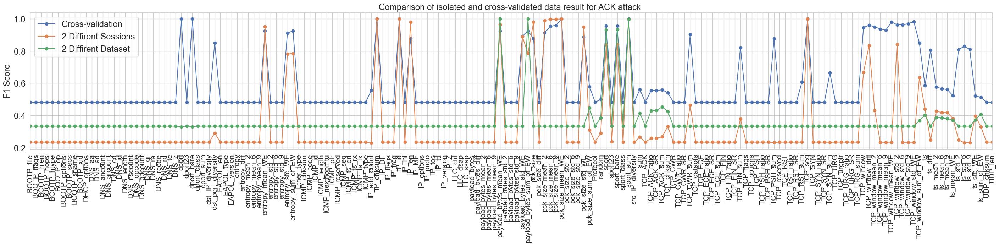

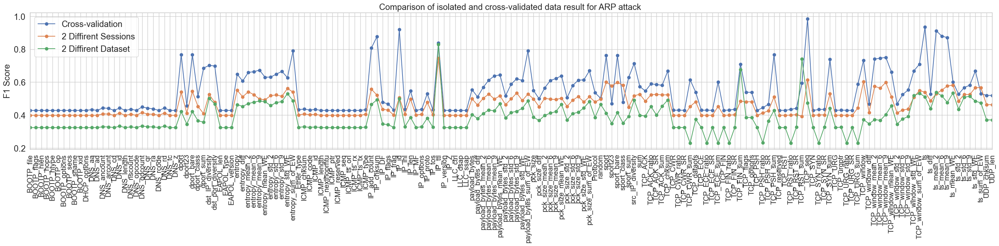

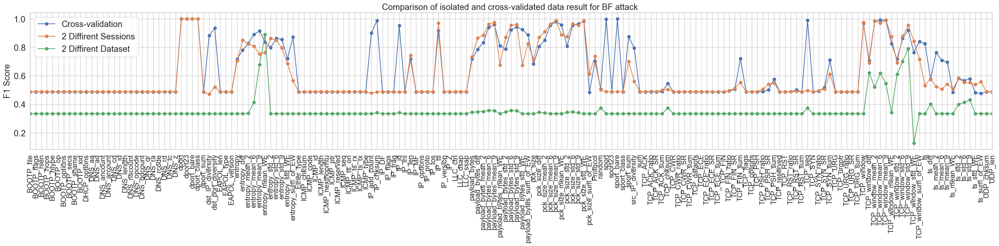

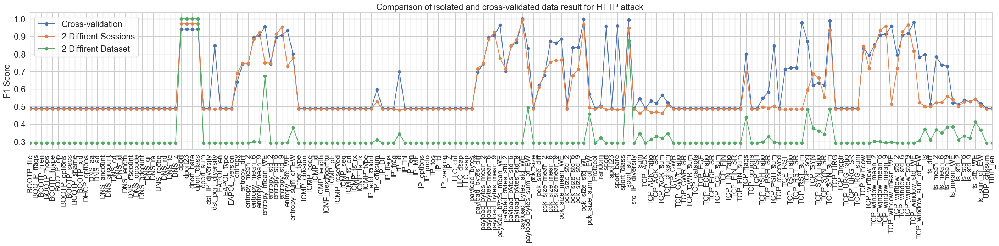

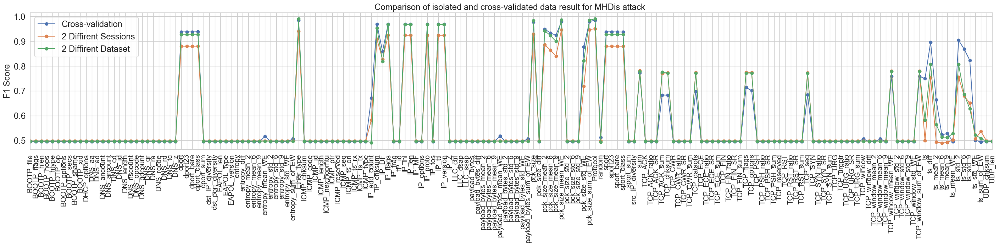

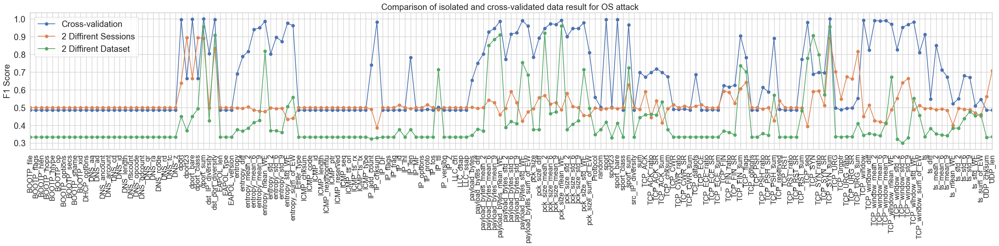

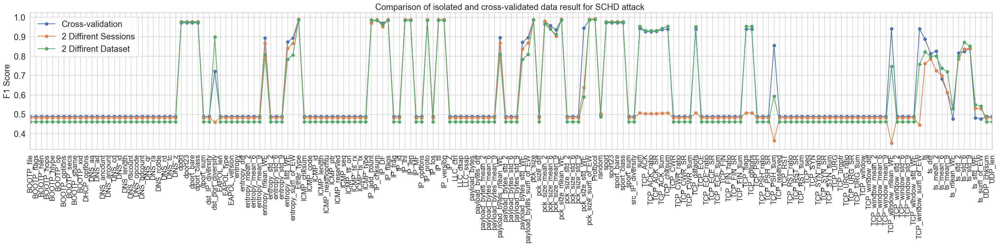

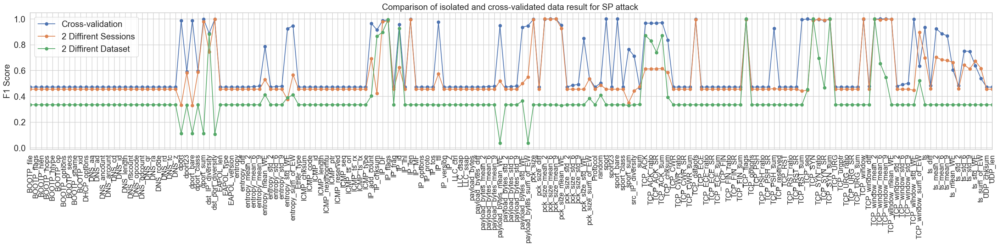

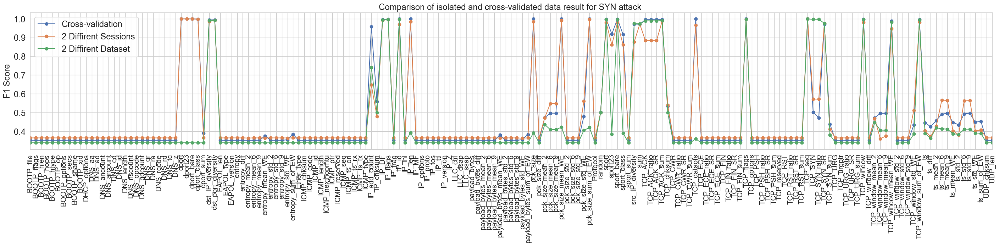

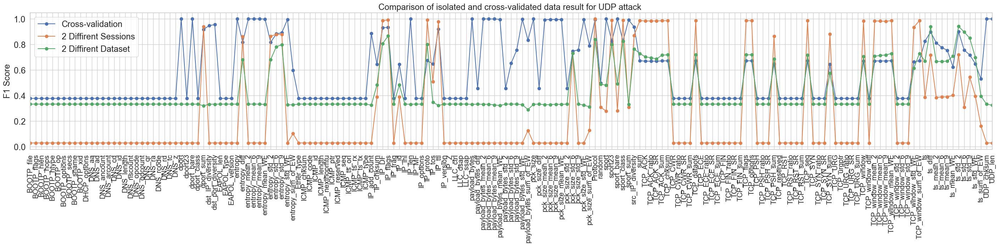

In [23]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
sns.set_style("whitegrid")
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (35, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'x-large'}
for i in results["Feature"].unique():    
    graph_name=f"./pdfs/Comparison_f1_{i}.pdf"
    plt.margins(x=0)
    
    df=results[results["Feature"]==i]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        pylab.rcParams.update(params)
        #plt.figure(figsize=(10,10))
        #plt.plot(my_xticks,iso['Acc'], linestyle='--', marker='.', color='b',label= "Separate Train & Test acc")
        #plt.plot(my_xticks,cv['Acc'], linestyle='--', marker='.', color='r',label= "10-Fold CV acc")
        plt.plot(my_xticks,sf['F1'], linestyle='-', marker='o',label= method[ii])
    #plt.plot(my_xticks,iso[' F1-score'], linestyle='-', marker='o', color='m',label= "Diffirent Dataset Isolated")
    #plt.plot(my_xticks,cv[' F1-score'], linestyle='-', marker='o', color='b',label= "5-Fold CV")
    #plt.axhline(0.492885, color='r',label= "Primary feature list")
    #plt.axhline(0.443367, color='r',label= "Primary feature list")
    plt.title(f"Comparison of isolated and cross-validated data result for {i} attack ")
    plt.legend(numpoints=1)
    #plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.ylabel("F1 Score")
    plt.xticks(rotation=90) 
    #plt.ylim([0.69, 0.71]) 
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
        
    

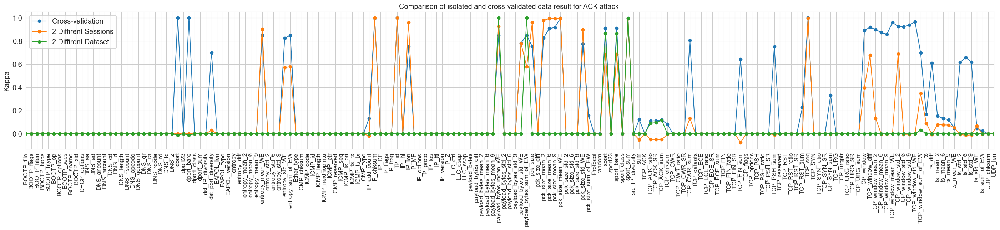

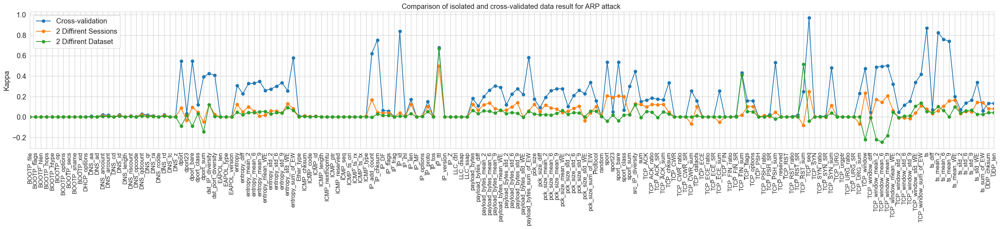

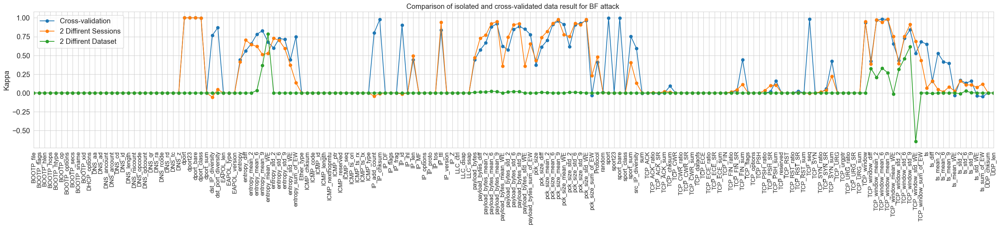

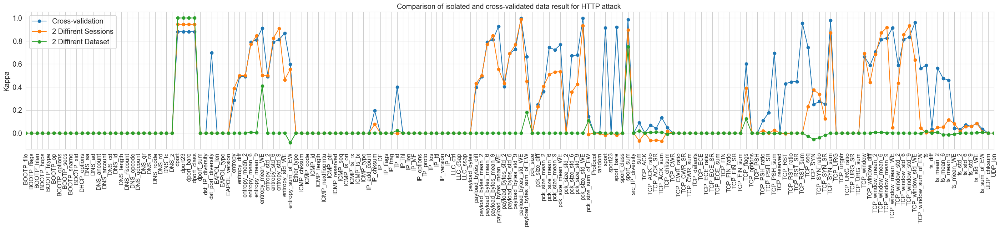

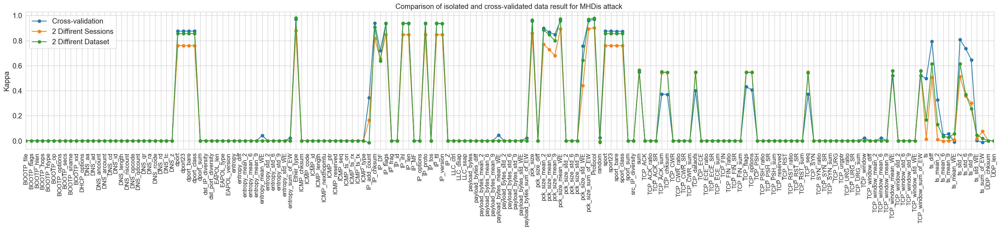

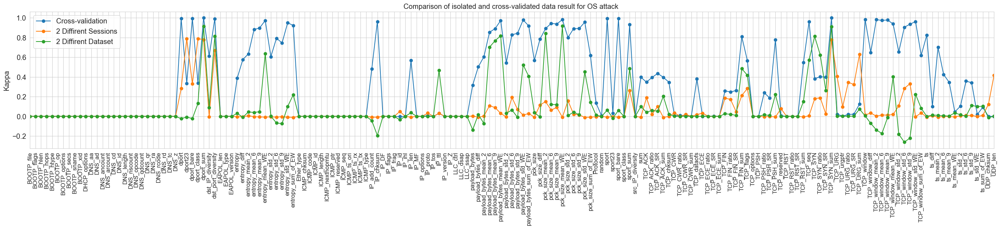

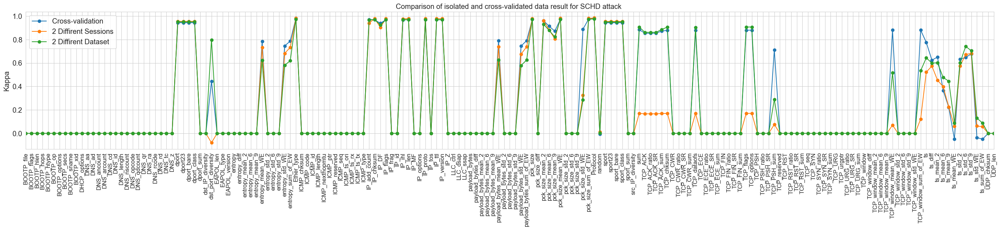

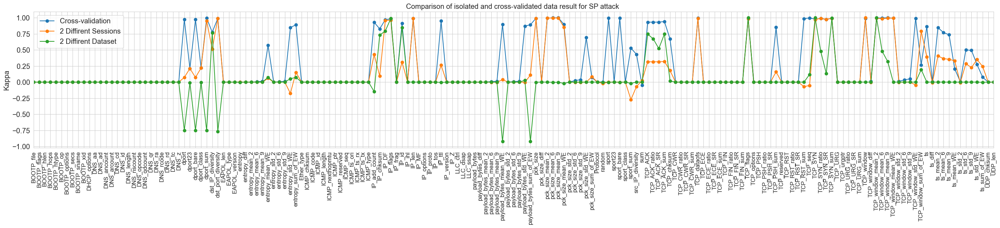

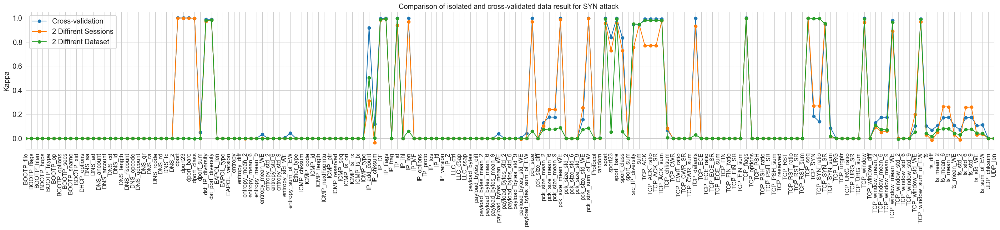

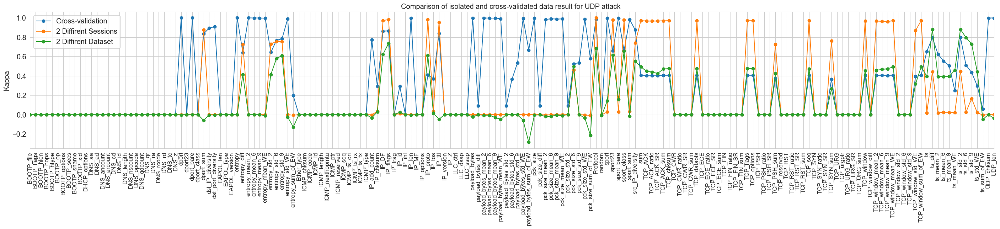

In [17]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
sns.set_style("whitegrid")
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (35, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'x-large'}
for i in results["Feature"].unique():    
    graph_name=f"./pdfs/Comparison_kappa_{i}.pdf"
    plt.margins(x=0)
    temp=[]
    df=results[results["Feature"]==i]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        pylab.rcParams.update(params)
        temp.append(sf['kap'].values)
        #plt.figure(figsize=(10,10))
        #plt.plot(my_xticks,iso['Acc'], linestyle='--', marker='.', color='b',label= "Separate Train & Test acc")
        #plt.plot(my_xticks,cv['Acc'], linestyle='--', marker='.', color='r',label= "10-Fold CV acc")
        plt.plot(my_xticks,sf['kap'], linestyle='-', marker='o',label= method[ii])
    #plt.plot(my_xticks,iso[' F1-score'], linestyle='-', marker='o', color='m',label= "Diffirent Dataset Isolated")
    #plt.plot(my_xticks,cv[' F1-score'], linestyle='-', marker='o', color='b',label= "5-Fold CV")
    #plt.axhline(0.492885, color='r',label= "Primary feature list")
    #plt.axhline(0.443367, color='r',label= "Primary feature list")
    plt.title(f"Comparison of isolated and cross-validated data result for {i} attack ")
    plt.legend(numpoints=1)
    #plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.ylabel("Kappa")
    plt.xticks(rotation=90) 
    #plt.ylim([0.69, 0.71]) 
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
    

In [24]:
IDF=['DNS_id',
     'TCP_seq','Ether_dst','ICMP_chksum',
'ICMP_id',"IP_len",  
"pck_size",
'ICMP_seq',"UDP_chksum",
'ICMP_unused',
'ID',
'IP_chksum',
'IP_dst',
"random",'src_IP_diversity',
'IP_id',
'IP_src','TCP_ack','TCP_chksum','sport_bare','dport_bare',
'dport23','sport23','dport',
'sport']
     
     
     

# 'sum',
#'TCP_ACK_sum',
#'TCP_CWR_sum',
#'TCP_ECE_sum',
#'TCP_FIN_sum',
#'TCP_PSH_sum',
#'TCP_RST_sum',
#'TCP_SYN_sum',
#'TCP_URG_sum',
#'UDP_chksum']

In [25]:
GA_input={}

____________________________________ACK________________________________________________________
57
['dport', 'dport_bare', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_id', 'IP_len', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'sport', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_CWR_sum', 'TCP_FIN_sum', 'TCP_PSH_sum', 'TCP_RST_sum', 'TCP_seq', 'TCP_SYN_sum', 'TCP_window', 'TCP_window_diff', 'TCP_window_mean_2', 'TCP_window_mean_6', 'TCP_window_mean_9', 'TCP_window_mean_WE', 'TCP_window_std_2', 'TCP_window_std_6', 'TCP_window_std_9', 'TCP_window_std_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 'ts_mean_6', 'ts_mean_9', 'ts_mean_WE', 'ts_std_2', 'ts_std_6', 'ts_std_9', 'ts_std_WE', 'ts_sum_of_E

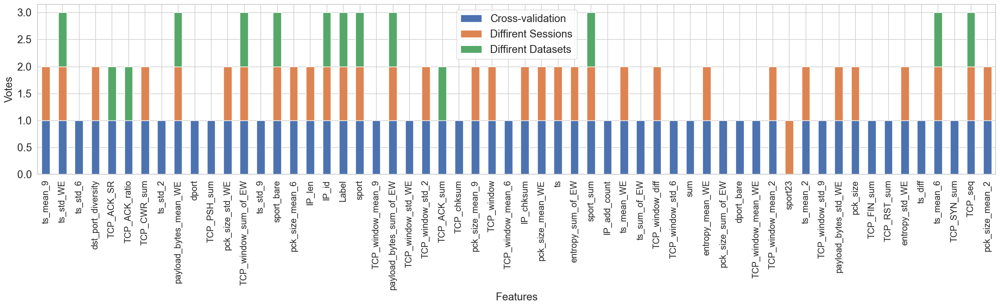

____________________________________ARP________________________________________________________
137
['DNS_aa', 'DNS_ancount', 'DNS_arcount', 'DNS_id', 'DNS_nscount', 'DNS_qdcount', 'DNS_qr', 'DNS_ra', 'DNS_rd', 'dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'Ether_type', 'ICMP_chksum', 'ICMP_code', 'ICMP_id', 'ICMP_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_frag', 'IP_id', 'IP_ihl', 'IP_len', 'IP_MF', 'IP_options', 'IP_proto', 'IP_tos', 'IP_ttl', 'IP_version', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'p

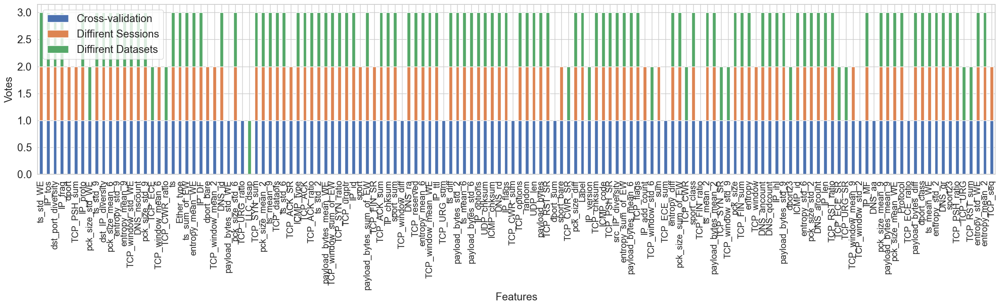

____________________________________BF________________________________________________________
81
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_id', 'IP_len', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'Protocol', 'random', 'sport', 'sport_bare', 'sport_sum', 'src_IP_diversity', 'TCP_chksum', 'TCP_FIN_ratio', 'TCP_FIN_SR', 'TCP

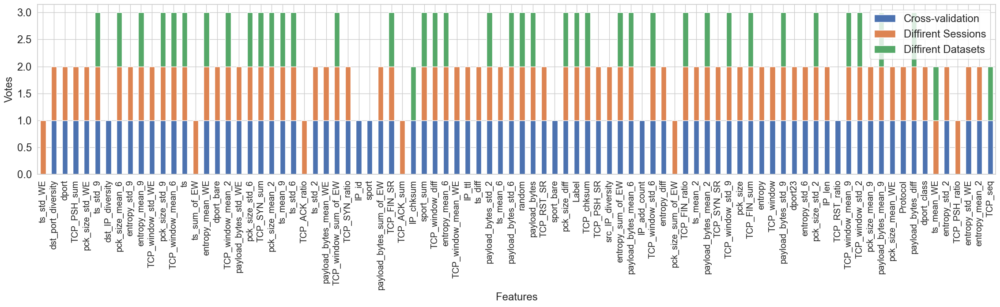

____________________________________HTTP________________________________________________________
82
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_chksum', 'IP_id', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'random', 'sport', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_flags', 'TCP_PSH_ratio', 'TCP_PSH_SR', 'TCP_PSH_sum', 'TCP_RST', 'TCP_RST_ratio', 'TCP_R

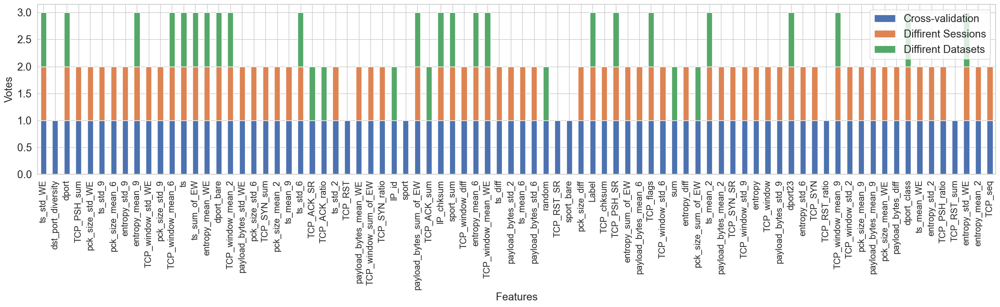

____________________________________MHDis________________________________________________________
52
['dport', 'dport23', 'dport_bare', 'dport_class', 'entropy_mean_WE', 'entropy_sum_of_EW', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len', 'IP_proto', 'IP_ttl', 'IP_version', 'payload_bytes_mean_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'random', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sum', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_options', 'TCP_seq', 'TCP_window', 'TCP_window_mean_6', 'TCP_window_mean_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 'ts_mean_6', 'ts_mean_9', 'ts_std_2', 'ts_std_6', 'ts_std_9', 'ts_std_WE', 'Label']


46
['dport', 'dport23', 'dport_bare', 'dport_class', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len', 'IP_proto', 

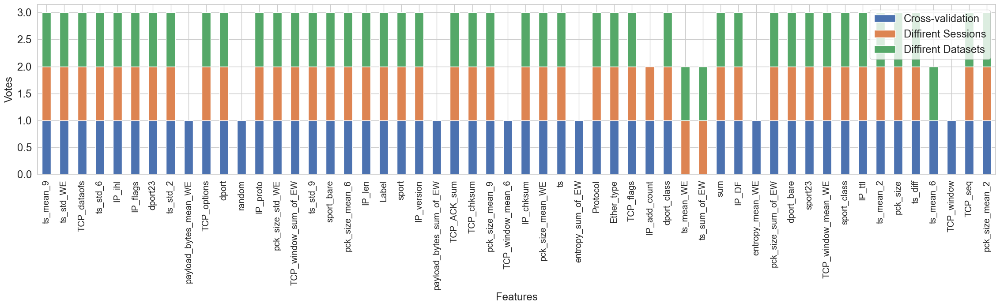

____________________________________OS________________________________________________________
107
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_len', 'IP_proto', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'random', 'sport', 'sport23', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK', '

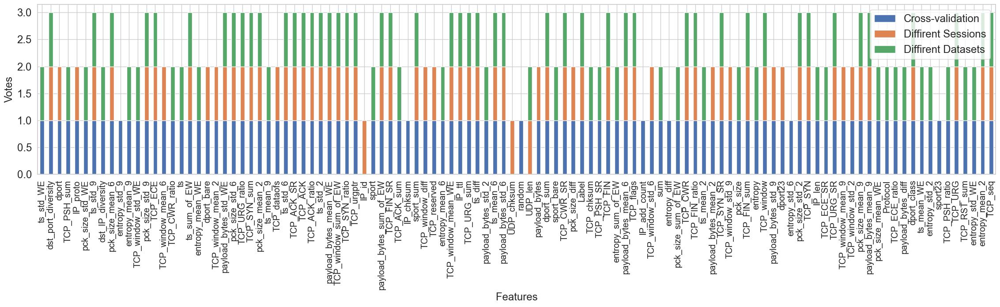

____________________________________SCHD________________________________________________________
54
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len', 'IP_proto', 'IP_ttl', 'IP_version', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sum', 'TCP_ACK', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_options', 'TCP_PSH_sum', 'TCP_window_mean_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 'ts_mean_6', 'ts_mean_9', 'ts_std_2', 'ts_std_6', 'ts_std_9', 'Label']


57
['dport', 'dport23', 'dport_bare', 'dport_class', 'entropy_mean_WE', 'entropy_std_WE', 'entropy

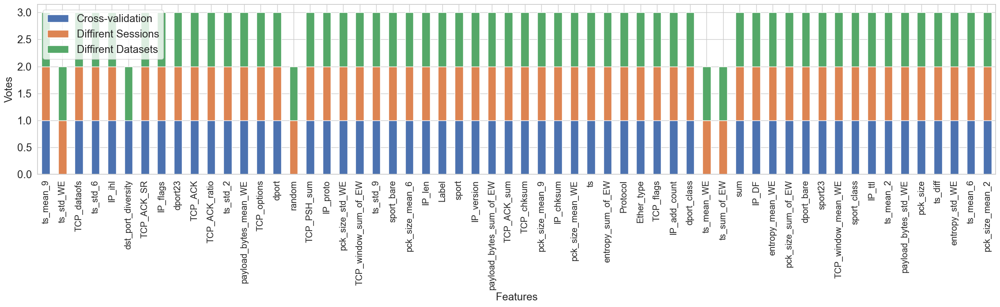

____________________________________SP________________________________________________________
81
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'IP_ttl', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'random', 'sport', 'sport_bare', 'sport_sum', 'src_IP_diversity', 'TCP_ACK', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_PSH_sum', 'TCP_RST_sum', 'TCP_seq', 'TCP_S

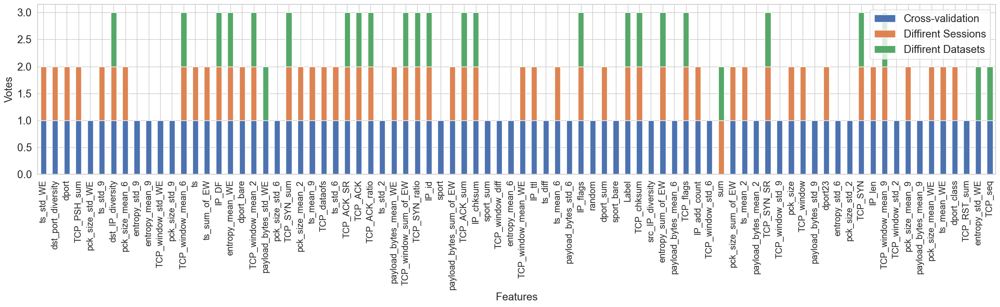

____________________________________SYN________________________________________________________
66
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'random', 'sport', 'sport23', 'sport_bare', 'sport_class', 'src_IP_diversity', 'sum', 'TCP_ACK', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_seq', 'TCP_SYN', 'TCP_SYN_ratio', 'TCP_SYN_SR', 'TCP_SYN_sum', 'TCP_urgptr', 'TCP_window', 'TCP_window_mean_2', 'TCP_window_mean_6', 'TCP_window_mean_9', 'TCP_window_mean_WE', 'TCP_window_std_2', 'TCP_window_std_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 't

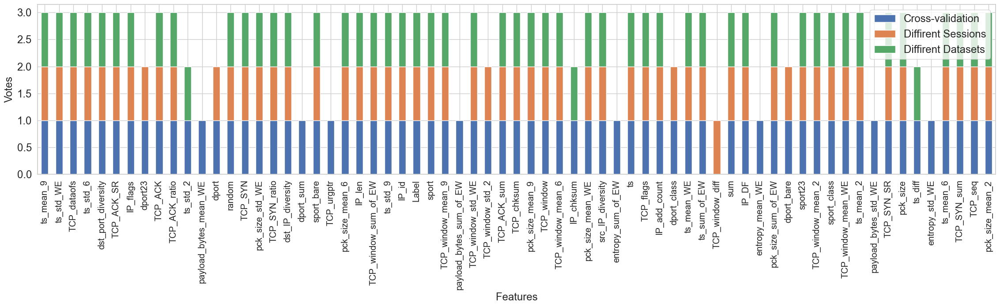

____________________________________UDP________________________________________________________
87
['dport', 'dport_bare', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'IP_proto', 'IP_tos', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sport_sum', 

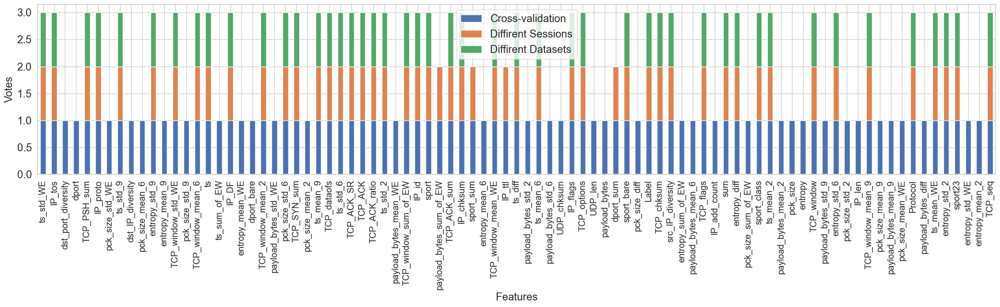

In [26]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
for attack in results["Feature"].unique():
    print(f"____________________________________{attack}________________________________________________________")
    #plt.margins(x=0)
    temp=[]
    df=results[results["Feature"]==attack]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        temp.append(sf['kap'].values)   
    itself=[]
    same=[]
    diff=[]
    my_xticks=my_xticks.values
    flag=1
    for j in range(len(temp[0])):
        if temp[0][j]>0:
            itself.append(my_xticks[j])
        if temp[1][j]>0:
            same.append(my_xticks[j])
        if temp[2][j]>0:
            diff.append(my_xticks[j])
    itself.append("Label")
    same.append("Label")
    diff.append("Label")
        
    for j in [itself,same]:
        print(len(j))
        print(f"{j}\n\n")
        
        
    merged=itself+same
    final_list=[]
    for d in diff:
        if d in merged:
            final_list.append(d)
            
        
        
        
        
        
    c1 = Counter(final_list)
    c2 = Counter(IDF)
    final_list = list((c1 - c2).elements())
    print(len(final_list))
    print(f"{final_list}\n\n")
    main=itself+same+diff

    GA_input[attack]=final_list
    main=set(main)
    mainlist=[]
    for i in main:
        temp=[i,int(i in itself),int(i in same),int(i in diff)]
        mainlist.append(temp)
    data=pd.DataFrame(mainlist, columns=["Feature", "Cross-validation","Diffirent Sessions","Diffirent Datasets"]).set_index('Feature')
    graph_name=f"./pdfs/kappa_{attack}_Voting2.PDF"
    import seaborn as sns
    sns.set_theme(style="whitegrid")

    plt.rcParams.update(params)
    import matplotlib.pylab as pylab

    #pylab.rcParams.update(params)

    data.plot.bar(stacked=True,figsize=(28,5))
    plt.xlabel('Features')
    plt.ylabel('Votes')
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
    

In [27]:
import json
with open('GA_input.json', 'w') as fp:
    json.dump(GA_input, fp)

In [28]:
GA_input

{'ACK': ['payload_bytes_mean_WE',
  'payload_bytes_sum_of_EW',
  'sport_sum',
  'TCP_ACK_ratio',
  'TCP_ACK_SR',
  'TCP_ACK_sum',
  'TCP_window_sum_of_EW',
  'ts_mean_6',
  'ts_std_WE',
  'Label'],
 'ARP': ['DNS_ancount',
  'DNS_arcount',
  'DNS_nscount',
  'DNS_qdcount',
  'DNS_qr',
  'DNS_ra',
  'DNS_rd',
  'dport_class',
  'dst_IP_diversity',
  'dst_port_diversity',
  'entropy',
  'entropy_diff',
  'entropy_mean_2',
  'entropy_mean_6',
  'entropy_mean_9',
  'entropy_mean_WE',
  'entropy_std_2',
  'entropy_std_6',
  'entropy_std_9',
  'entropy_std_WE',
  'entropy_sum_of_EW',
  'Ether_type',
  'ICMP_code',
  'ICMP_type',
  'IP_DF',
  'IP_flags',
  'IP_frag',
  'IP_ihl',
  'IP_MF',
  'IP_options',
  'IP_proto',
  'IP_tos',
  'IP_ttl',
  'IP_version',
  'payload_bytes',
  'payload_bytes_diff',
  'payload_bytes_mean_2',
  'payload_bytes_mean_6',
  'payload_bytes_mean_9',
  'payload_bytes_mean_WE',
  'payload_bytes_std_2',
  'payload_bytes_std_6',
  'payload_bytes_std_9',
  'payload_bytes